In [20]:
from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [0]:
import os
os.chdir("/content/drive/Shared drives/CARD/projects/iNDI/line_prioritization/projects_lirong/combined1_hNGN2/scanpy")

In [0]:
# required for umap clustering
! pip3 install leidenalg 
! pip3 install scanpy
# ! pip install python-igraph
# ! pip install louvain
import h5py
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt


In [23]:
sc.settings.verbosity = 3 
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)

scanpy==1.4.6 anndata==0.7.1 umap==0.4.1 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.10.2 python-igraph==0.8.0


In [25]:
%ls scanpy_out/

combined1_hNGN2.h5ad  top_markers_combined1_hNGN2.csv


In [0]:
# load the scanpy object which has been analyzed before
adata = sc.read("scanpy_out/combined1_hNGN2.h5ad")

In [27]:
adata

AnnData object with n_obs × n_vars = 10342 × 2814 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

# Plot the expression of neural stem cell markers, precursor marker, and neuronal markers

## Disapearance of the stem cell marker

Note that on there are a small group of cells on the left still express SOX2.
 
Nanog and oct4: stem cell marker

Sox2 : neuron precursor cell (NPC)marker

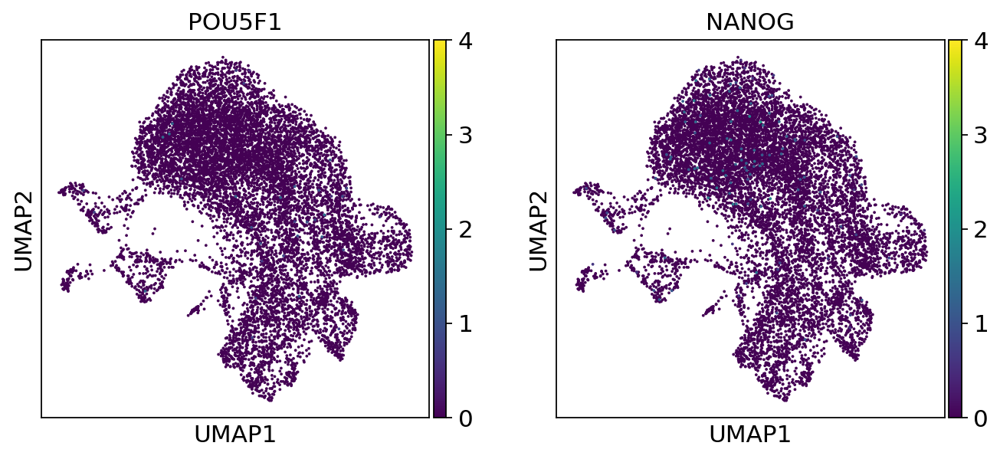

In [28]:
# stem cell marker expression should be gone since cells were induced by hNGN2: oct4 (POU5F1)
sc.pl.umap(adata, color=['POU5F1', 'NANOG'], vmax=4)

## Expression of genes expressed in neuronal precursor cells (NPC)

Endogenous NPC markers nestin (NES) and NEUROD1

Ectopically expressed ngn2(NEUROG2)

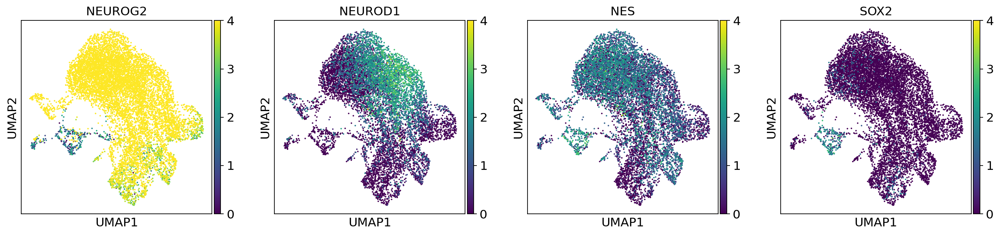

In [29]:

# sc.pl.umap(adata, color=['leiden', 'TMEM106B','MAPT'], save='Combined2_resolution2_pc50.pdf', vmax=3)
# plot the expression of neuronal precursor cell (NPC) markers nestin and sox2, progenitor marker :ngn2(NEUROG2)
sc.pl.umap(adata, color=['NEUROG2', 'NEUROD1', "NES", "SOX2" ], vmax=4)

## Expression of pan-neural markers

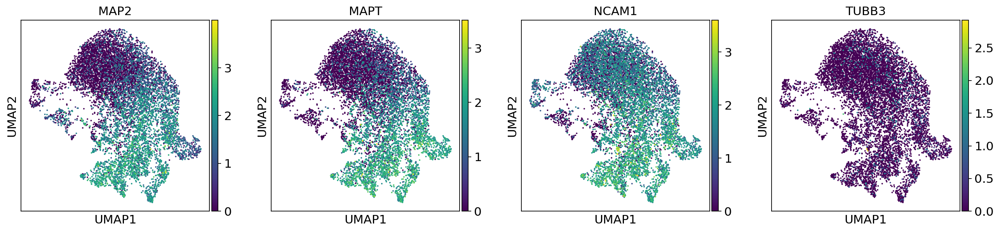

In [0]:
# plot the expression of neuron marker MAP2, MAPT 
# MAP2, NuJ1 (TUBB3), NCAM and are pan-neuron makers
sc.pl.umap(adata, color=['MAP2', 'MAPT','NCAM1','TUBB3'])

plot the other candiates that are induced by hNGN2 in iPSC in the paper of Neuron.

NeuN (RBFOX3), BRN2 (POU3F2), syb2(VAMP2), DLX1, cpx1(CPXM1), munc18-1(STXBP1), syntaxin (STX1A)

No significant changes in DLX1, CPXM1, NeuN, and STX1A

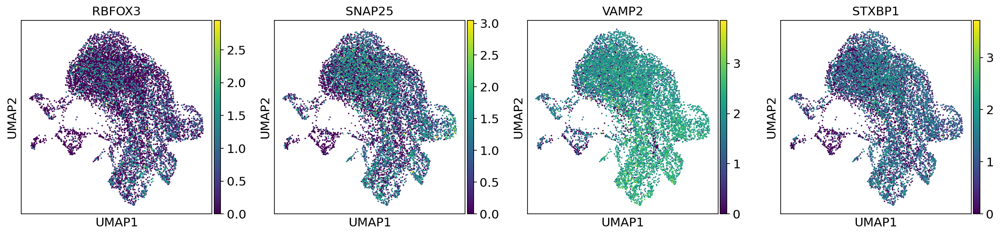

In [30]:
sc.pl.umap(adata, color=['RBFOX3', 'SNAP25','VAMP2', 'STXBP1'])

## Expression of subtype neural markers

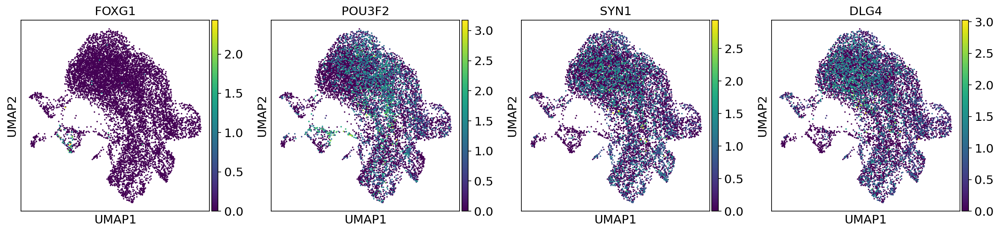

In [31]:
# excitatory cortical neuron makers: FOXG1, POU3F2
# presynaptic marker: synapsin(SYN1)
# postsynaptic maker: PSD-95(DLG4)
sc.pl.umap(adata, color=['FOXG1', 'POU3F2', 'SYN1', 'DLG4'])

# Add my donor information from vireo_out

Note that there are unassigned cells due to the assigning ambugrity between GT19-38452 or  GT19-38451.

Next time, remove the sample of GT19-38452 from donor_vcf files before runing vireo

For the present, manually assign GT19-38452/1 back to cell barcodes

In [0]:
# input my donor information from vireo_out
%ls ../vireo/vireo_out/

donor_ids.tsv                  _log.txt             prob_singlet.tsv.gz
fig_GT_distance_estimated.pdf  prob_doublet.tsv.gz  summary.tsv


In [0]:
donors= pd.read_csv("../vireo/vireo_out/donor_ids.tsv", '\t', index_col="cell")
donors.head(4)

,donor_id,prob_max,prob_doublet,n_vars,best_singlet,best_doublet
cell,,,,,,
AAACCCAAGGCTTTCA-1,GT19-38447,1.000000e+00,1.440000e-40,629,GT19-38447,"GT19-38447,GT19-38450"
AAACCCAAGTACAGCG-1,GT19-38446,1.000000e+00,3.380000e-14,210,GT19-38446,"GT19-38446,GT19-38447"
AAACCCACACGCGCTA-1,doublet,5.880000e-90,1.000000e+00,1533,GT19-38450,"GT19-38447,GT19-38452"
AAACCCACAGGTACGA-1,GT19-38445,1.000000e+00,1.990000e-36,691,GT19-38445,"GT19-38445,GT19-38449"


Assign missing donor_id to cell barcodes

In [0]:
for i in range(len(donors)):
  if donors.iloc[i, 4] == "GT19-38451" or donors.iloc[i, 4] == "GT19-38452":
    donors.iloc[i, 0] = "GT19-38451"

In [0]:
donors_subset = donors[["donor_id"]]
donors_subset["donor_label"]=donors["donor_id"]

In [0]:
# only get the column of interest and add one more for match to meatadata
donors_subset.head()

,donor_id,donor_label
cell,,
AAACCCAAGGCTTTCA-1,GT19-38447,GT19-38447
AAACCCAAGTACAGCG-1,GT19-38446,GT19-38446
AAACCCACACGCGCTA-1,doublet,doublet
AAACCCACAGGTACGA-1,GT19-38445,GT19-38445
AAACCCAGTACGACAG-1,GT19-38450,GT19-38450


# get the metadata of the donors

In [0]:
%ls ../../test_vireo/modify_donor/

'Copy of 19-Cel-005 Metadata.xlsx'   test_cell.vcf.gz
 meta_wgs_Psomagen.csv               test_donor_copy.vcf
 sedfnjT29                           test_donor_to_use_small.vcf.gz
 sub_UNHS_2.vcf.gz                   test_donor_to_use.vcf.gz
 sub_UNHS_changed_copy.vcf           test_donor.vcf
 sub_UNHS_changed.vcf                test_donor.vcf.gz
 sub_UNHS_changed.vcf.gz             test_donor.vcf.gz.tbi
 sub_UNHS_changed.vcf.gz.tbi         UNHS_to_use.vcf.gz
 sub_UNHS_filter.vcf.gz              UNHS.vcf.gz
 sub_UNHS.vcf.gz                     UNHS.vcf.gz.csi
 sub_UNHS.vcf.gz.csi                 UNHS.vcf.gz.tbi
 test_cell.vcf


In [0]:
# retrieve the 8 donor's original labels from metadata
meta = pd.read_csv("../../test_vireo/modify_donor/meta_wgs_Psomagen.csv")
meta=meta.loc[:, ["sample_id", "donor_label"]]
meta

,sample_id,donor_label
0,GT19-38445,KOLF2-ARID2-A02
1,GT19-38446,KUCG3-C1
2,GT19-38447,NCRM1-C6
3,GT19-38448,NCRM5-C5
4,GT19-38449,PGP1-C2
5,GT19-38450,LNGPI1-C1
6,GT19-38451,NN0003932-C3
7,GT19-38452,NN0004297-C1


# match donor_id to donor_label

In [0]:
# # match donor_id to donor_label
vals_to_replace = {'GT19-38445':'KOLF2-ARID2-A02', 
                   'GT19-38446':'KUCG3-C1', 
                   'GT19-38447':'NCRM1-C6',
                   'GT19-38448':'NCRM5-C5',
                   'GT19-38449':'PGP1-C2',
                   'GT19-38450':'LNGPI1-C1',
                   'GT19-38451':'NN0003932-C3 or NN0004297-C1'
                   }

donors_subset["donor_label"] = donors_subset["donor_label"].map(vals_to_replace)

In [0]:
donors_subset.head()

,donor_id,donor_label
cell,,
AAACCCAAGGCTTTCA-1,GT19-38447,NCRM1-C6
AAACCCAAGTACAGCG-1,GT19-38446,KUCG3-C1
AAACCCACACGCGCTA-1,doublet,NaN
AAACCCACAGGTACGA-1,GT19-38445,KOLF2-ARID2-A02
AAACCCAGTACGACAG-1,GT19-38450,LNGPI1-C1


In [0]:
adata.obs.head()

,n_genes,percent_mito,n_counts,leiden,donor_id,donor_label
AAACCCAAGGCTTTCA-1,2220,0.081570,4536.0,0,GT19-38447,NCRM1-C6
AAACCCAAGTACAGCG-1,1113,0.046083,1736.0,1,GT19-38446,KUCG3-C1
AAACCCACACGCGCTA-1,4366,0.048278,12138.0,7,doublet,NaN
AAACCCACAGGTACGA-1,2372,0.089549,4880.0,15,GT19-38445,KOLF2-ARID2-A02
AAACCCAGTACGACAG-1,2025,0.125534,4684.0,7,GT19-38450,LNGPI1-C1


In [0]:
# note that the row numbers of donor_subset and that of adata are not the same because adata has been filtered for doublets
print("cell numbers in donor_file are:", len(donors_subset))
print("cell numbers in adata are:", len(adata.obs))

cell numbers in donor_file are: 10224
cell numbers in adata are: 9775


# merge donor_label to adata

In [0]:
# merge two dataframes
adata.obs = adata.obs.merge(donors_subset, left_index=True, right_index=True)
adata.obs.head()

,n_genes,percent_mito,n_counts,leiden,donor_id,donor_label
AAACCCAAGGCTTTCA-1,2220,0.081570,4536.0,0,GT19-38447,NCRM1-C6
AAACCCAAGTACAGCG-1,1113,0.046083,1736.0,1,GT19-38446,KUCG3-C1
AAACCCACACGCGCTA-1,4366,0.048278,12138.0,7,doublet,NaN
AAACCCACAGGTACGA-1,2372,0.089549,4880.0,15,GT19-38445,KOLF2-ARID2-A02
AAACCCAGTACGACAG-1,2025,0.125534,4684.0,7,GT19-38450,LNGPI1-C1


In [0]:
# generate a table in which list the cell lines by Leiden-derived clusters in each experiment
adata.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9775 entries, AAACCCAAGGCTTTCA-1 to TTTGTTGTCTTTACAC-1
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   n_genes       9775 non-null   int64   
 1   percent_mito  9775 non-null   float32 
 2   n_counts      9775 non-null   float32 
 3   leiden        9775 non-null   category
 4   donor_id      9775 non-null   category
 5   donor_label   9775 non-null   category
dtypes: category(3), float32(2), int64(1)
memory usage: 579.2+ KB


In [0]:
adata.obs.to_csv("scanpy_out/combined2_hNGN2_adata_with_donors.csv")

In [0]:
table = adata.obs.groupby(['donor_label'])['leiden'].agg(["count", "nunique", "unique"])

In [0]:
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

In [0]:
table

,count,nunique,unique
donor_label,,,
KOLF2-ARID2-A02,758,15,"[15, 0, 5, 9, 2, ..., 4, 8, 7, 11, 14] Length: 15 Categories (15, object): [15, 0, 5, 9, ..., 8, 7, 11, 14]"
KUCG3-C1,684,16,"[1, 8, 0, 5, 4, ..., 12, 15, 13, 14, 7] Length: 16 Categories (16, object): [1, 8, 0, 5, ..., 15, 13, 14, 7]"
LNGPI1-C1,1096,16,"[7, 0, 12, 5, 10, ..., 15, 8, 14, 6, 9] Length: 16 Categories (16, object): [7, 0, 12, 5, ..., 8, 14, 6, 9]"
NCRM1-C6,3162,16,"[0, 5, 1, 3, 4, ..., 8, 7, 14, 13, 15] Length: 16 Categories (16, object): [0, 5, 1, 3, ..., 7, 14, 13, 15]"
NCRM5-C5,625,16,"[4, 2, 12, 5, 3, ..., 0, 8, 10, 14, 7] Length: 16 Categories (16, object): [4, 2, 12, 5, ..., 8, 10, 14, 7]"
NN0003932-C3 or NN0004297-C1,1470,16,"[4, 0, 9, 6, 3, ..., 11, 8, 5, 7, 10] Length: 16 Categories (16, object): [4, 0, 9, 6, ..., 8, 5, 7, 10]"
PGP1-C2,1336,15,"[2, 6, 3, 12, 1, ..., 8, 5, 15, 13, 7] Length: 15 Categories (15, object): [2, 6, 3, 12, ..., 5, 15, 13, 7]"
nan,644,16,"[7, 8, 14, 1, 5, ..., 11, 13, 9, 10, 15] Length: 16 Categories (16, object): [7, 8, 14, 1, ..., 13, 9, 10, 15]"


In [0]:
table.to_csv("scanpy_out/combined2_donor_by_leiden.csv")

In [0]:
table2 = adata.obs.groupby(['leiden'])['donor_label'].agg(["count", "nunique", "unique"])

In [0]:
table2

,count,nunique,unique
leiden,,,
0,1929,8,"[NCRM1-C6, LNGPI1-C1, NN0003932-C3 or NN0004297-C1, KUCG3-C1, PGP1-C2, KOLF2-ARID2-A02, nan, NCRM5-C5] Categories (8, object): [NCRM1-C6, LNGPI1-C1, NN0003932-C3 or NN0004297-C1, KUCG3-C1, PGP1-C2, KOLF2-ARID2-A02, nan, NCRM5-C5]"
1,1767,8,"[KUCG3-C1, NCRM1-C6, PGP1-C2, NN0003932-C3 or NN0004297-C1, NCRM5-C5, nan, LNGPI1-C1, KOLF2-ARID2-A02] Categories (8, object): [KUCG3-C1, NCRM1-C6, PGP1-C2, NN0003932-C3 or NN0004297-C1, NCRM5-C5, nan, LNGPI1-C1, KOLF2-ARID2-A02]"
2,948,8,"[PGP1-C2, NCRM5-C5, NCRM1-C6, KUCG3-C1, KOLF2-ARID2-A02, nan, NN0003932-C3 or NN0004297-C1, LNGPI1-C1] Categories (8, object): [PGP1-C2, NCRM5-C5, NCRM1-C6, KUCG3-C1, KOLF2-ARID2-A02, nan, NN0003932-C3 or NN0004297-C1, LNGPI1-C1]"
3,751,8,"[PGP1-C2, NCRM1-C6, NN0003932-C3 or NN0004297-C1, NCRM5-C5, LNGPI1-C1, KOLF2-ARID2-A02, nan, KUCG3-C1] Categories (8, object): [PGP1-C2, NCRM1-C6, NN0003932-C3 or NN0004297-C1, NCRM5-C5, LNGPI1-C1, KOLF2-ARID2-A02, nan, KUCG3-C1]"
4,661,8,"[NN0003932-C3 or NN0004297-C1, NCRM1-C6, NCRM5-C5, PGP1-C2, KUCG3-C1, nan, KOLF2-ARID2-A02, LNGPI1-C1] Categories (8, object): [NN0003932-C3 or NN0004297-C1, NCRM1-C6, NCRM5-C5, PGP1-C2, KUCG3-C1, nan, KOLF2-ARID2-A02, LNGPI1-C1]"
5,657,8,"[NCRM1-C6, LNGPI1-C1, NCRM5-C5, KOLF2-ARID2-A02, KUCG3-C1, nan, PGP1-C2, NN0003932-C3 or NN0004297-C1] Categories (8, object): [NCRM1-C6, LNGPI1-C1, NCRM5-C5, KOLF2-ARID2-A02, KUCG3-C1, nan, PGP1-C2, NN0003932-C3 or NN0004297-C1]"
6,579,8,"[PGP1-C2, NCRM1-C6, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, nan, KUCG3-C1, NCRM5-C5, LNGPI1-C1] Categories (8, object): [PGP1-C2, NCRM1-C6, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, nan, KUCG3-C1, NCRM5-C5, LNGPI1-C1]"
7,516,8,"[nan, LNGPI1-C1, NCRM1-C6, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, KUCG3-C1, NCRM5-C5, PGP1-C2] Categories (8, object): [nan, LNGPI1-C1, NCRM1-C6, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, KUCG3-C1, NCRM5-C5, PGP1-C2]"
8,455,8,"[KUCG3-C1, nan, NCRM1-C6, PGP1-C2, NCRM5-C5, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, LNGPI1-C1] Categories (8, object): [KUCG3-C1, nan, NCRM1-C6, PGP1-C2, NCRM5-C5, NN0003932-C3 or NN0004297-C1, KOLF2-ARID2-A02, LNGPI1-C1]"


In [0]:
table2.to_csv("scanpy_out/combined2_leiden_by_donor.csv")

In [0]:
adata.write_h5ad("scanpy_out/combined2_hNGN2_with_donors.h5ad")

... storing 'donor_id' as categorical
... storing 'donor_label' as categorical


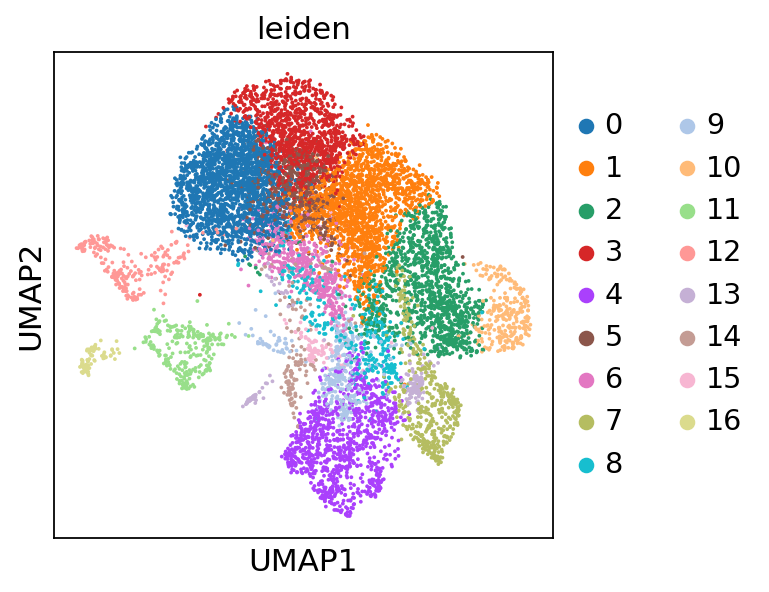

In [32]:
# skip gene "TMEM106B)"
sc.pl.umap(adata, color=['leiden'])

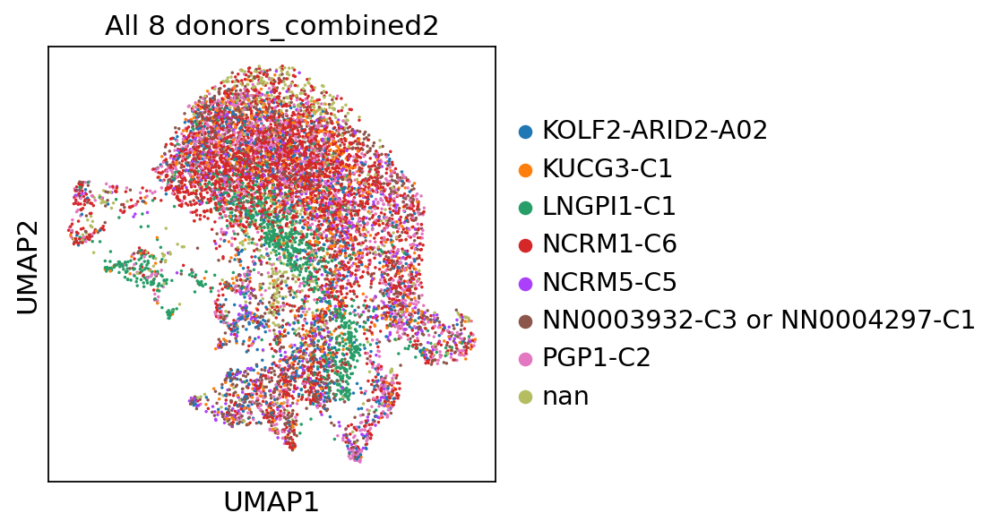

In [0]:
sc.pl.umap(adata, color=['donor_label'], title="All 8 donors_combined2", size=10, save="Combined2_hNGN2_donors_alone.pdf")

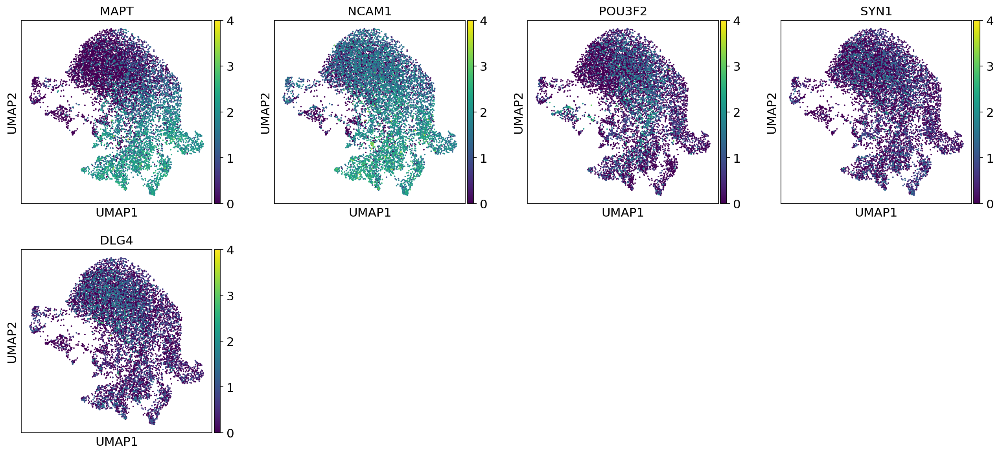

In [0]:
sc.pl.umap(adata, color=['MAPT', 'NCAM1', 'POU3F2', 'SYN1', 'DLG4'], vmax=4)

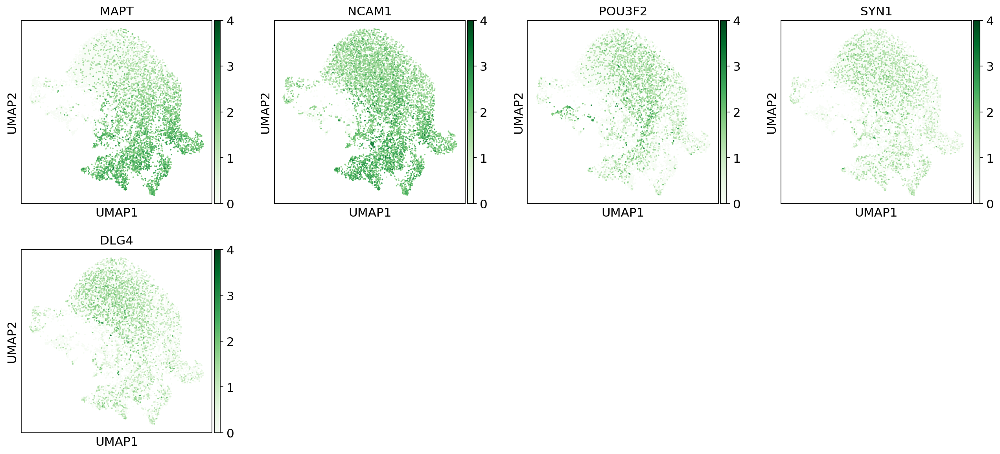

In [0]:
sc.pl.umap(adata, color=['MAPT', 'NCAM1', 'POU3F2', 'SYN1', 'DLG4'], color_map="Greens", vmax=4)

In [0]:
labels = meta["donor_label"].to_list()
labels

['KOLF2-ARID2-A02',
 'KUCG3-C1',
 'NCRM1-C6',
 'NCRM5-C5',
 'PGP1-C2',
 'LNGPI1-C1',
 'NN0003932-C3',
 'NN0004297-C1']

In [0]:
labels = ['KOLF2-ARID2-A02',
 'KUCG3-C1',
 'NCRM1-C6',
 'NCRM5-C5',
 'PGP1-C2',
 'LNGPI1-C1',
 'NN0003932-C3 or NN0004297-C1', 'nan']

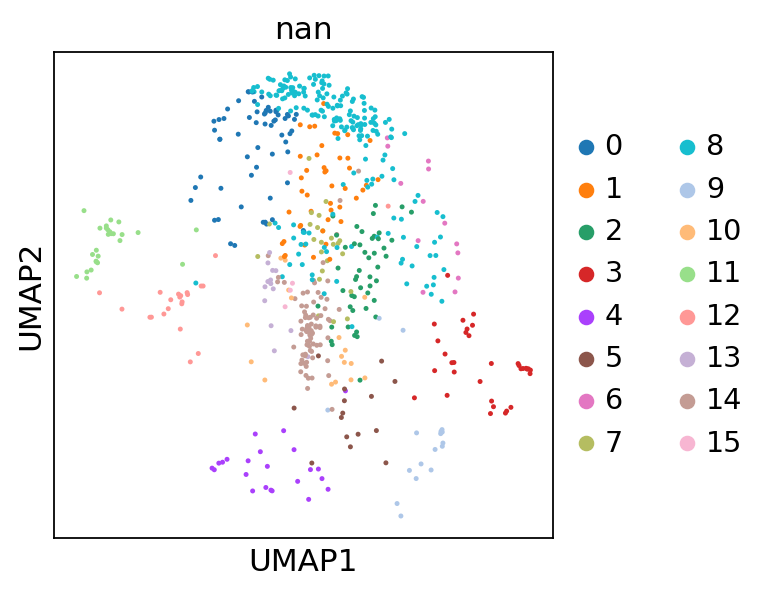

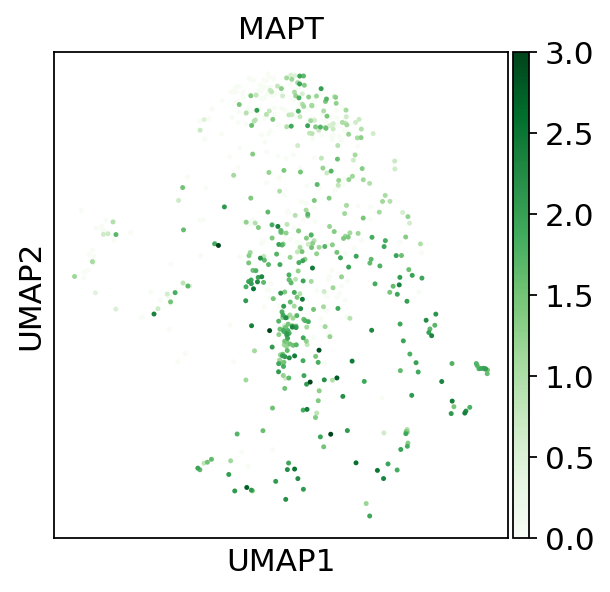

In [0]:
ax = sc.pl.umap(adata[adata.obs["donor_label"] == "nan"], color="leiden", color_map="Blues", title='nan', size=20)
sc.pl.umap(
    adata[adata.obs["donor_label"] == "nan"],
    size=20,
    color=["MAPT"],
    color_map="Greens",
    vmax=3,
    ax = ax
  )

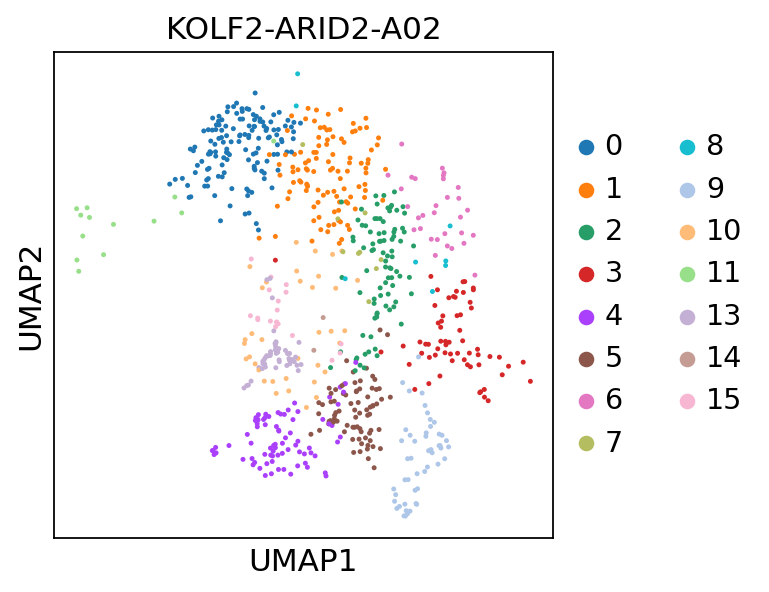

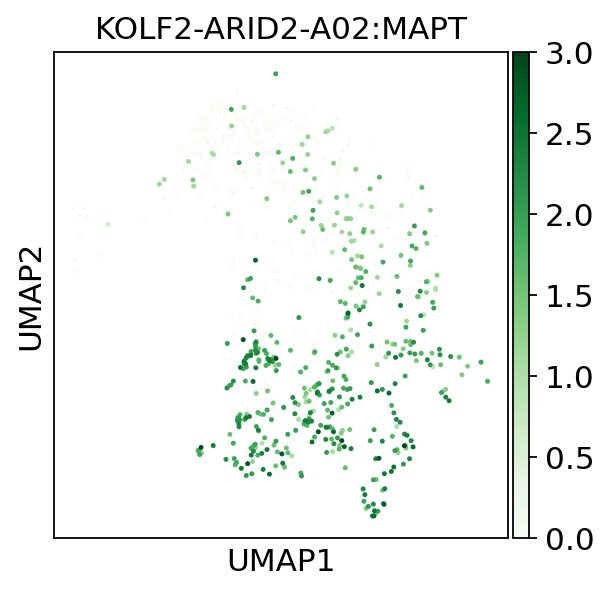

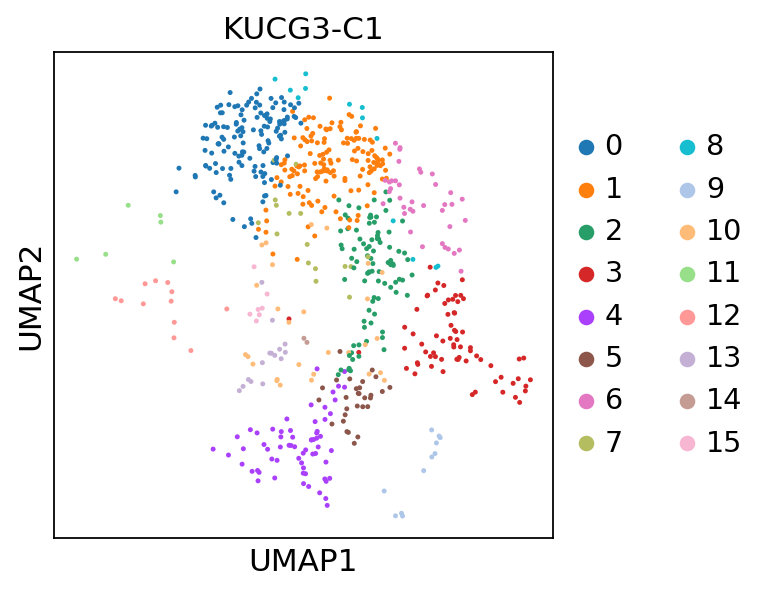

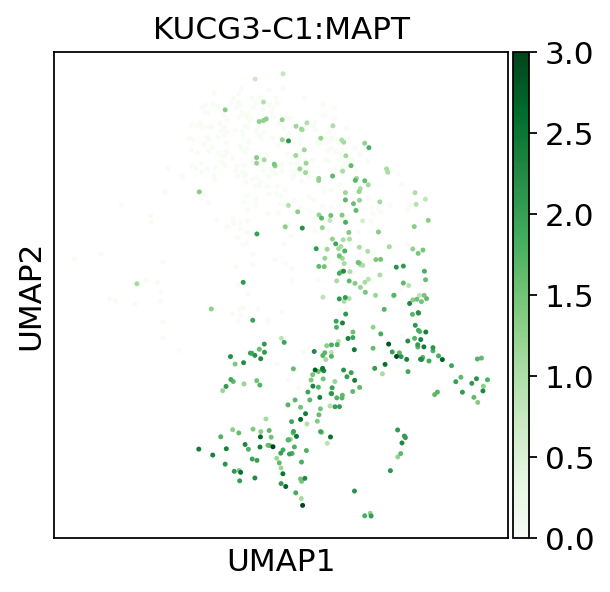

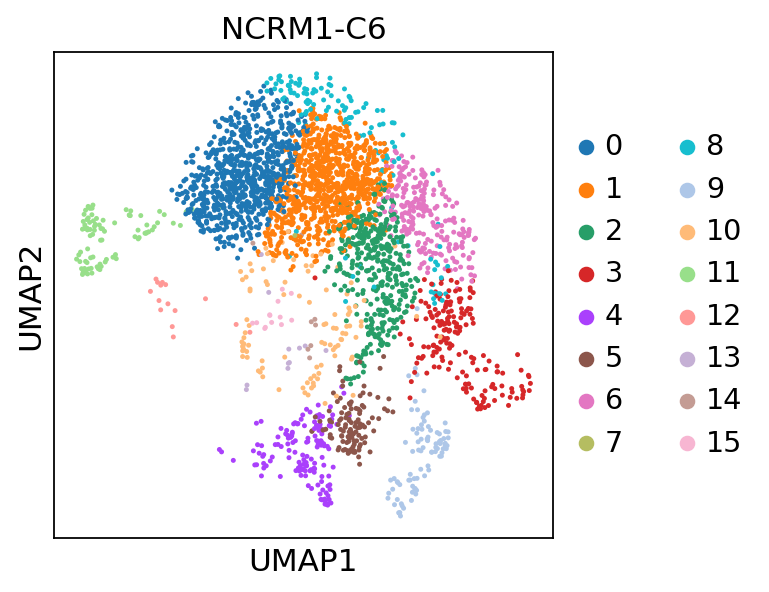

...

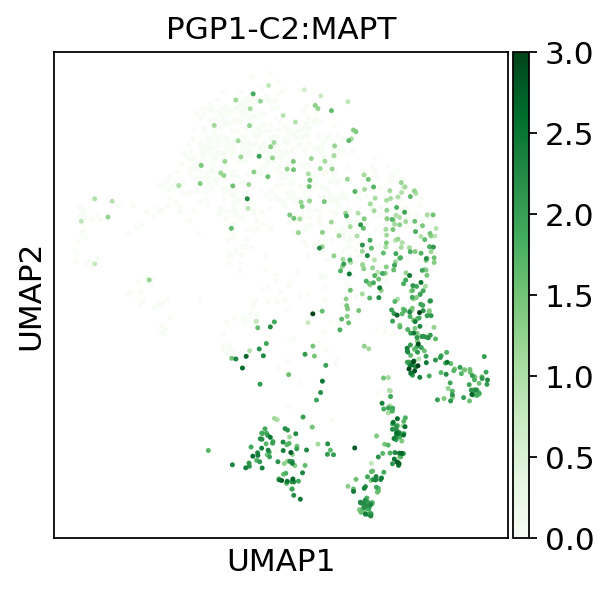

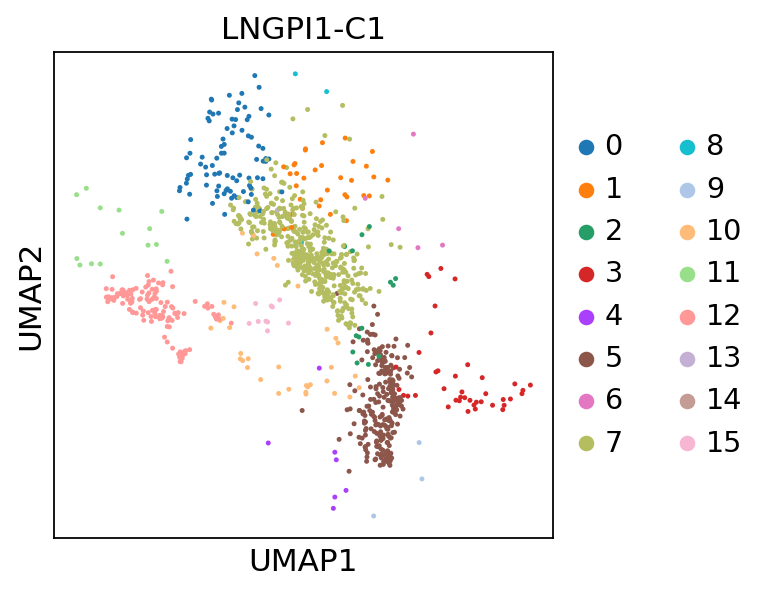

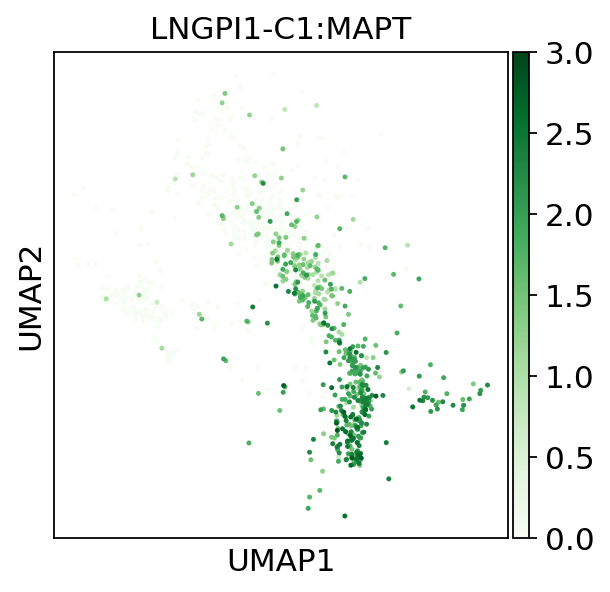

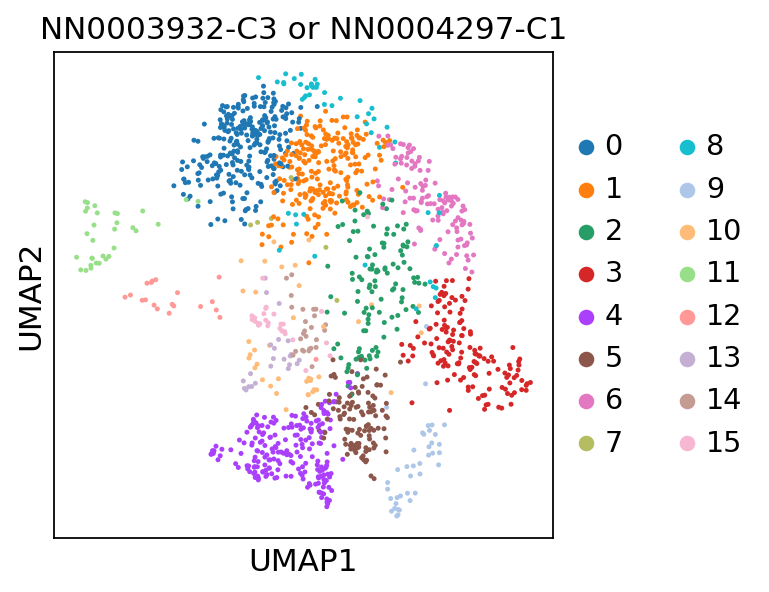

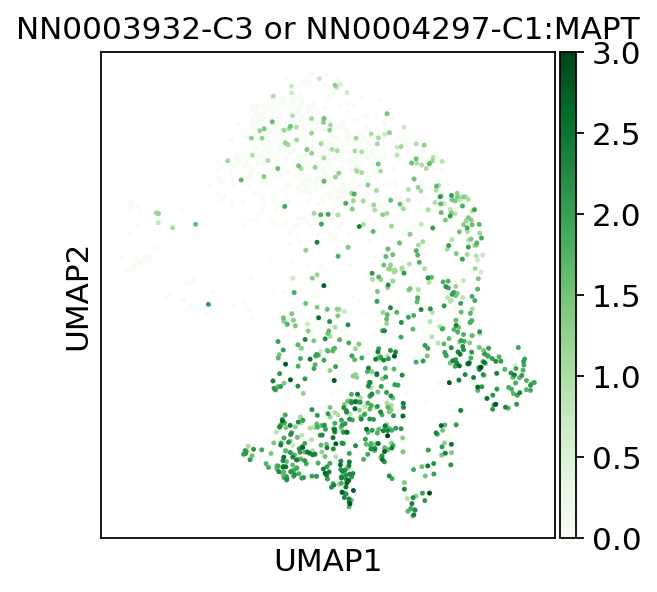

In [0]:
for i in labels:
  ax_title=i+":MAPT"
  ax = sc.pl.umap(adata[adata.obs["donor_label"] == i], color="leiden", color_map="Blues", title=i, size=20)
  sc.pl.umap(
    adata[adata.obs["donor_label"] == i],
    size=20,
    color=["MAPT"],
    color_map="Greens",
    vmax=3,
    title=ax_title,
    ax = ax
  )


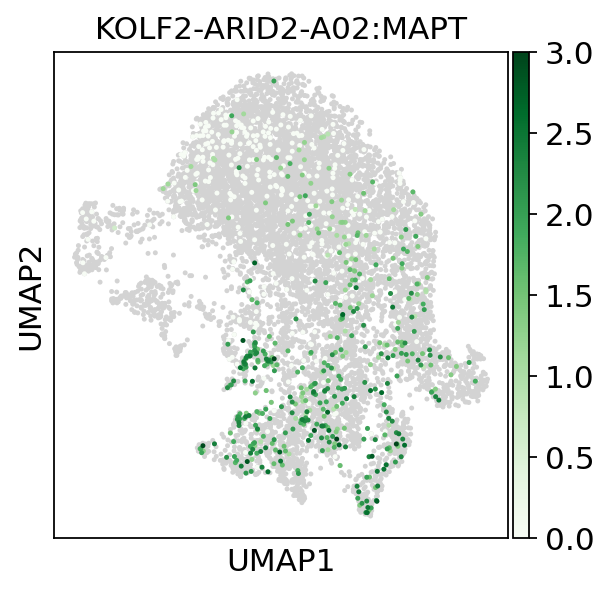

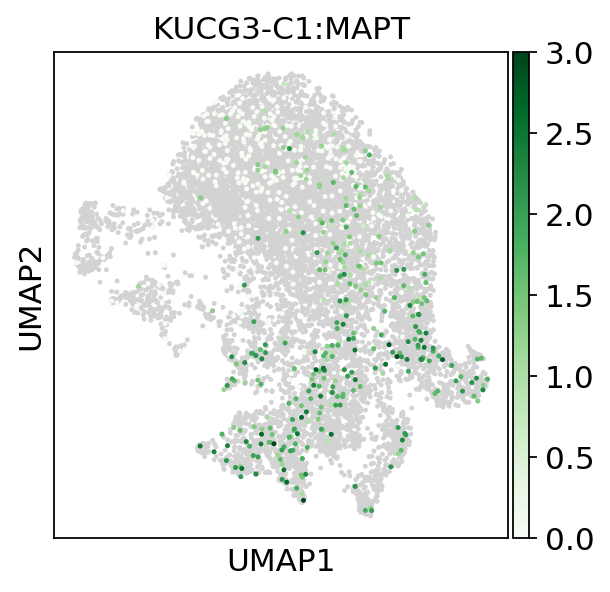

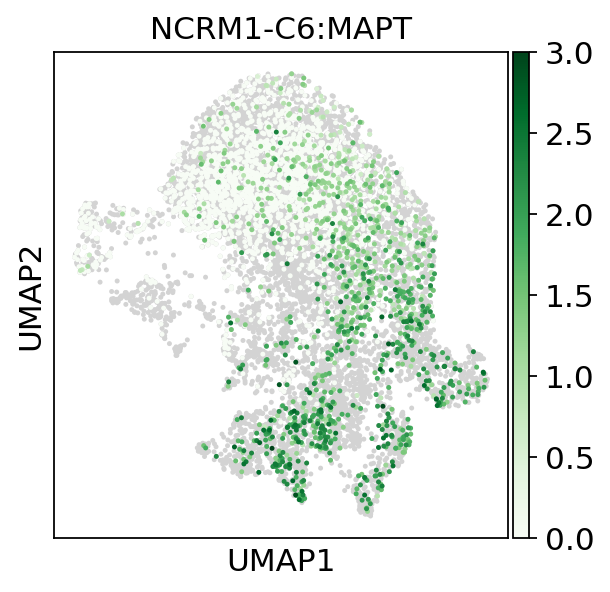

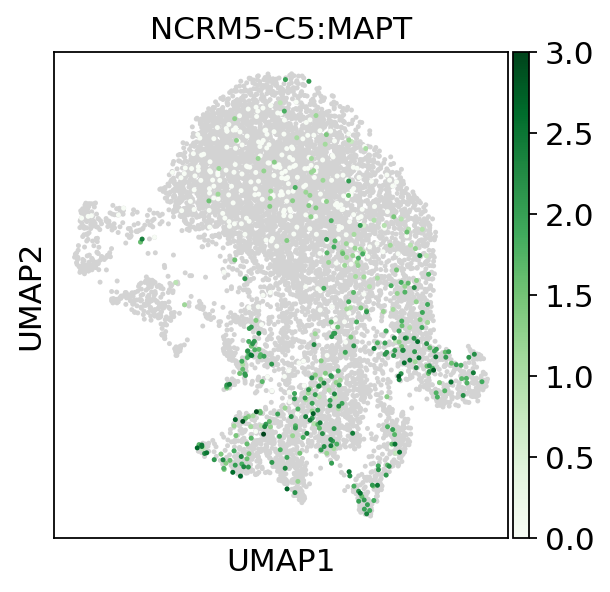

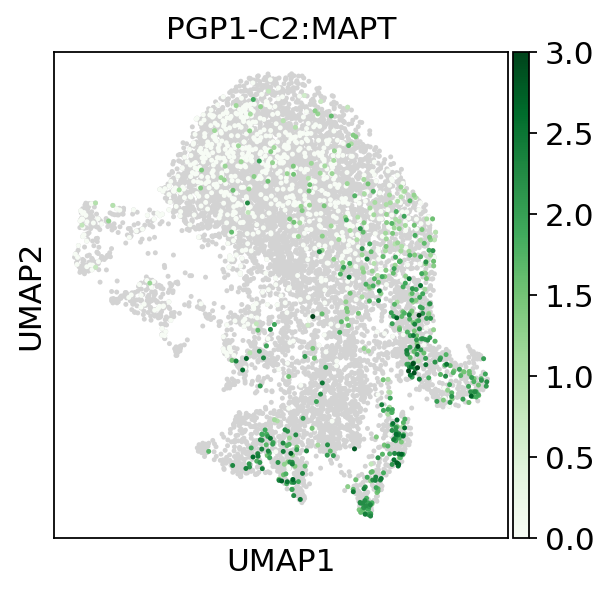

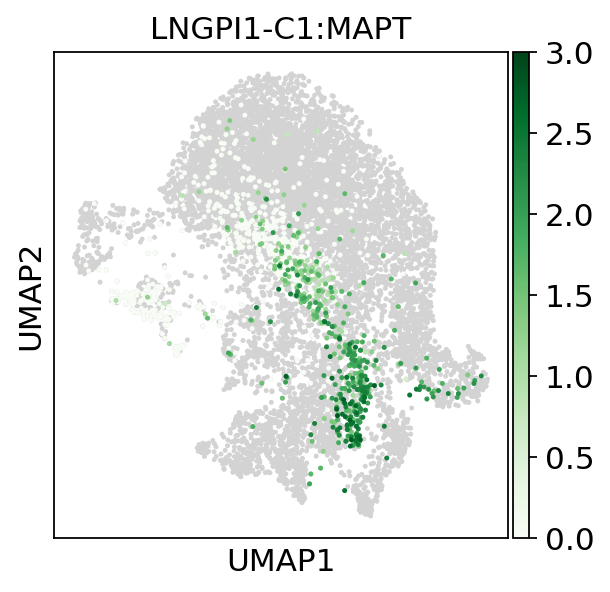

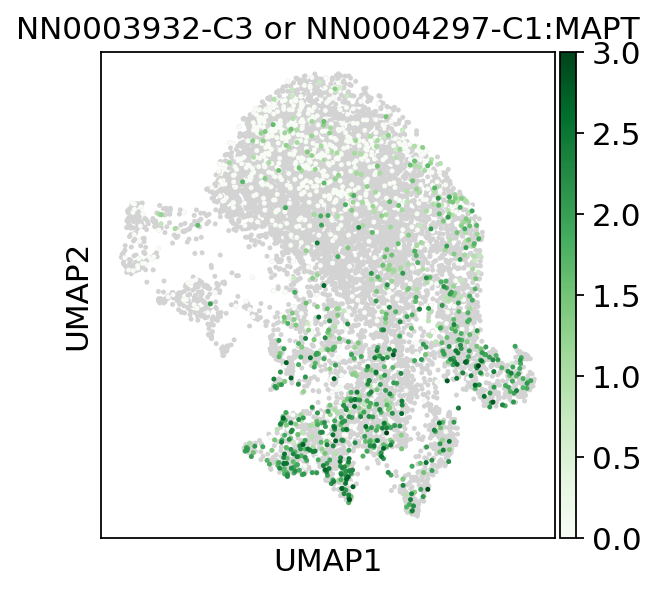

In [0]:
for i in labels:
  ax_title=i+":MAPT"
  ax = sc.pl.umap(adata, size=20, show=False)
  sc.pl.umap(
    adata[adata.obs["donor_label"] == i],
    size=20,
    color=["MAPT"],
    color_map="Greens",
    vmax=3,
    ax=ax, title=ax_title, save=i+".pdf"
  )


In [0]:
%%bash
cd projects_lirong/combined2_hNGN2/scanpy/
mkdir data_for_scanpy/
mv scRNA_Seq_experiment_1_Combined2_hNGN2_outs_filtered_feature_bc_matrix.h5 data_for_scanpy/